<div style="text-align: right"><b> Jessenia Piza Londoño, Manuela Acosta Fajardo & Sebastián Martínez Vidal. </b></div>

# Proyecto II

In [1]:
import pickle
from sklearn.decomposition import PCA, FastICA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MaxAbsScaler
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

from sklearn import preprocessing
from scipy.spatial.distance import pdist, squareform
from scipy.linalg import eigh

from sklearn.model_selection import cross_val_score
from sklearn.mixture import GaussianMixture
from matplotlib.colors import LogNorm
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn import metrics

import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('seaborn-darkgrid')

# Modulos de scikit-learn
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, classification_report, precision_score, accuracy_score
from sklearn.metrics import  roc_auc_score, roc_curve
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn import feature_selection

import statsmodels.formula.api as smf
import statsmodels.api as sm
import itertools

import warnings
warnings.filterwarnings("ignore")

**Nota:** Usaremos la función vista en clase para realizar las matrices de confusión

In [2]:
# Funcion para calcular y visualizar la matriz de confusion 
def plotCM(ytrue, ypred, clases=None, normalize = False, ax = None):
    """ Funcion para calcular y visualizar la matriz de confusion"""
    
    if clases == None:
        clases = list(set(ytrue))
        clases.sort() # etiquetas unicas ordenadas alfabeticamente
    
    CM = confusion_matrix(ytrue,ypred, labels=clases)
    
    #Normaliza la matriz de confusion dividiendo cada fila por el total de verdaderos
    if normalize:
        CM = 100*CM / CM.sum(axis=1).reshape(-1,1) #Aprovechando el Broadcasting!
 
    df = pd.DataFrame(CM, index=clases, columns=clases)
    df.index.name = 'True'; df.columns.name = 'Predicted'
    
    sns.heatmap( df, # Visualizando la matriz de confusion
             annot=True, fmt='2.1f', cmap='ocean_r',cbar=False,square=True, annot_kws={'fontsize':16}, ax=ax )
    
    plt.show()

## Introducción

Por medio de este proyecto haremos un análisis de los datos contenidos en el dataset Abnormal Blood Cells, el cual cuenta con 214 descriptores de células de sangre periférica. El objetivo del mismo es clasificar estas observaciones, según el tipo de célula, y según la entidad.


Leemos los datos correspondientes a imágenes de células de sangre periférica. En este, se pueden observar paticularmente algunos leucocitos (glóbulos blancos), blastos, linfocitos reactivos, linfocitos normales y linfocitos anormales.

In [3]:
with open('Abnormal_Blood_Cells/BL_RL_N_malignanCells.pkl', 'rb') as f:
    data = pickle.load(f)

Dado que algunos de los datos eran valores nulos, se decidió cambiar estos valores por cero. De esta manera, podemos trabajar los datos de manera más adecuada.

In [4]:
data = data.fillna(0)

Los descriptores de empiezan desde la sexta columna. El objetivo del siguiente proyecto es clasificar el tipo de célula. Para esto, clasificaremos de dos maneras: por tipo de célula y por entidad.

In [5]:
X = data.iloc[:,5:] # Descriptores
y1 = data['tipoCelula'] # Tipo de célula
y2 = data['entidad'] # Entidad

Dividimos los datos en datos de prueba y de entrenamiento para las dos clasificaciones a realizar. Tomamos $70\%$ de entrenamiento y $30\%$ de prueba.

In [6]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y1, train_size=0.7, test_size=0.3, random_state=42)
X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y2, train_size=0.7, test_size=0.3, random_state=42)

Identificamos los tipos de célula y las entidades que tienen el dataset.

In [7]:
data.tipoCelula.value_counts()

BL    6564
RL    1452
N     1089
Name: tipoCelula, dtype: int64

In [8]:
data.entidad.value_counts()

LAL-B_NO_BURKITT       1968
CLR                    1452
LAM_MIELOMONOCITICA    1418
LAM_MONOCITICA         1201
LAM_MIELOIDE           1190
NORMAL                 1089
LAL-T                   648
LAL-B_BURKITT           139
Name: entidad, dtype: int64

Para visualizar y entender de mejor manera los datos, haremos las siguientes técnicas de reducción de la dimesión: `PCA, ICA, t-SNE`

## PCA

Comenzamos haciendo `PCA` primero para el tipo de célula. Para esto primero estándarizamos los datos y evaluamos el modelo con 10 componentes preestablecidas.

In [9]:
scaler = preprocessing.StandardScaler().fit(X_train1)
pca1 = PCA(n_components=10)
Y1 = pca1.fit(scaler.transform(X_train1),y_train1 )
Y1 = Y1.fit_transform(X_train1)

Visualizamos cada una de las componentes para identificar si alguna componente se ve relacionada con otra.

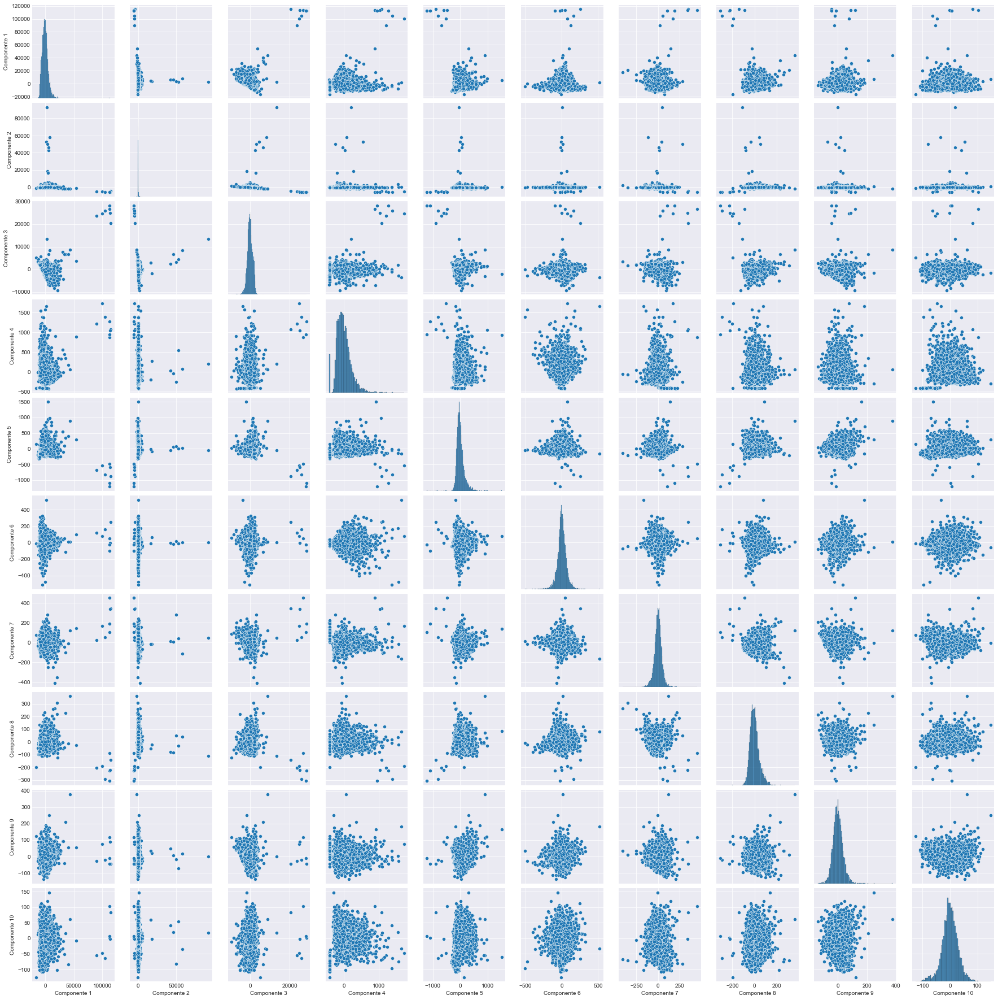

In [10]:
Y1 = pd.DataFrame(Y1)
Y1.columns = [f'Componente {i+1}' for i in range(10)]
sns.pairplot(Y1)

Dado que con el anterior diagrama no logramos identificar de buena manera las componentes que se relacionan, decidimos sacar cada una de las componentes para ver cómo se comportan los datos en estas:

In [11]:
pca1_dataframe = pd.DataFrame(pca1.components_, columns =X.columns)
pca1_dataframe

,Hairiness,RBCproximity,Area_cel,EquivDiameter_cel,Eccentricity_cel,Perimeter_cel,Solidity_cel,Extent_cel,circularity_cel,Elongation_cel,...,Gra_R_kurto_cyt,Gra_G_kurto_cyt,Gra_R_kurto_cel,Gra_G_kurto_cel,Pgra_R_kurto_nuc,Pgra_G_kurto_nuc,Pgra_R_kurto_cyt,Pgra_G_kurto_cyt,Pgra_R_kurto_cel,Pgra_G_kurto_cel
0,0.010651,0.000008,0.960537,0.003626,1.810316e-06,0.013343,-5.604185e-07,-4.358821e-08,-0.000003,1.652533e-06,...,0.000006,-0.000013,0.000017,0.000018,0.000085,0.000095,2.627129e-05,0.000015,0.000044,0.000056
1,0.987930,-0.000002,-0.052996,0.000291,2.965130e-07,0.001476,-4.572571e-07,-7.137405e-07,-0.000002,1.775993e-07,...,-0.000020,-0.000023,0.000007,0.000007,0.000035,0.000042,-8.225687e-07,0.000003,0.000028,0.000031
2,0.154492,-0.000003,0.272261,-0.002047,7.355915e-07,-0.003298,-3.095216e-06,-1.054411e-06,-0.000009,1.299328e-06,...,0.000063,0.000073,-0.000027,-0.000028,-0.000238,-0.000243,1.705848e-06,-0.000014,-0.000151,-0.000163
3,0.003245,-0.000024,0.011699,-0.007644,-5.394857e-05,-0.046218,2.515281e-05,4.345070e-05,0.000062,-4.246944e-05,...,0.001720,0.001984,-0.000010,-0.000078,0.000035,-0.000108,1.807594e-03,0.002344,0.000115,0.000063
4,-0.001245,0.000384,-0.013527,0.016607,1.516400e-04,0.097777,-5.542100e-05,-8.233215e-05,-0.000135,9.584164e-05,...,0.001135,0.000030,0.000481,0.000521,0.000568,0.000471,8.415444e-04,-0.000430,0.000629,0.000551
5,-0.000777,-0.000183,0.000798,-0.007488,-3.523710e-04,-0.110448,8.709273e-05,1.475051e-04,0.000257,-2.417251e-04,...,0.001626,0.001671,-0.000251,-0.000246,-0.000439,-0.000257,1.435822e-03,0.002979,-0.000410,-0.000212
6,0.000232,-0.000341,0.006457,-0.032454,-1.415661e-03,-0.640825,5.283384e-04,7.295266e-04,0.001576,-9.867778e-04,...,-0.007205,-0.006509,-0.001061,-0.001087,-0.000163,0.000976,-6.755210e-03,-0.004825,-0.000224,0.000688
7,-0.001016,-0.000326,-0.007866,0.038667,1.385361e-03,0.692848,-5.483687e-04,-7.695432e-04,-0.001617,1.006872e-03,...,0.000171,-0.000039,-0.000463,-0.000598,0.002624,0.003815,2.681014e-03,0.003536,0.001100,0.002974
8,0.000257,0.000101,-0.001105,-0.027645,1.477883e-04,0.085116,-1.619498e-04,-1.935714e-04,-0.000462,1.242411e-04,...,-0.003072,-0.002008,-0.000689,-0.000352,-0.007172,-0.007234,-2.209715e-03,-0.004761,-0.003669,-0.005125
9,0.000171,0.000587,0.000641,0.001388,-4.168056e-04,-0.193452,2.040236e-04,2.683765e-04,0.000585,-3.342946e-04,...,0.019562,0.021445,0.001436,0.000774,0.001487,0.000456,1.449657e-02,0.016017,0.002945,0.001028


Para identificar qué determina cada componente, sacamos los valores máximos y mínimos del modelo realizado.

In [12]:
pd.concat((pca1_dataframe.idxmax(axis=1),pca1_dataframe.max(axis=1), 
           pca1_dataframe.idxmin(axis=1),pca1_dataframe.min(axis=1)),axis=1, keys=['Máximo', 'Valor', 'Mínimo', 'Valor'])

,Máximo,Valor,Mínimo,Valor
0,Area_cel,0.960537,G_S2_CluPromi_cyt,-0.006166
1,Hairiness,0.987930,Area_cel,-0.052996
2,Area_cel,0.272261,Area_nuc,-0.948963
3,G_S2_CluPromi_cyt,0.730287,Perimeter_cel,-0.046218
4,G_S2_CluPromi_cel,0.822203,G_S2_CluShade_cyt,-0.054715
5,G_S2_CluPromi_cyt,0.656220,R_S2_CluPromi_cyt,-0.711392
6,R_S2_CluPromi_nuc,0.416164,Perimeter_cel,-0.640825
7,Perimeter_cel,0.692848,G_S2_CluPromi_cel,-0.143553
8,R_S2_CluPromi_cel,0.672674,G_S2_CluPromi_nuc,-0.520231
9,R_S1_Mean_cyt,0.562354,G_S2_CluPromi_cel,-0.390717


De la anterior tabla podemos concluir lo siguiente con respecto al tipo de célula:
- La componente 1 está casi en su totalidad determinada por el área de la célula y la componente 2 por la cantidad de vellosidades de la célula.
- La componente 2 está determinada por el área del núcleo en aproximadamente un 95% y por el área de la célula en un 27%.
- La componente 3 la determina un descriptor de segundo orden de cluster prominense del citoplasma en un 73%, mientras que la componente 4 está determinada en un 82% también por un descriptor de segundo orden de cluster prominense pero del núcleo de la célula.
- La componente 5 se ve determinada por dos clusters prominenses del citoplasma pero uno verde y otro rojo con 65% y 71%, respectivamente.
- La componente 6 se ve evidenciada por el perímetro de la célula en un 64% y por un cluster rojo prominense en el núcleo de la célula con un 42%.
- La componente 7 se evidencia en un 69% por el perímetro de la célula.
- La componente 8 se evidencia tanto por un cluster rojo prominense de la célula con un 67% como con un cluster verde prominense del núcleo con un 52%.
- La componente 9 se ve evidenciada por un descriptor rojo de la media del citoplasma con un 56% y con un 39% a un descriptor de segundo orden verde del cluster prominense de la célula.

Ahora realizamos el mismo procedimiento anteriormente hecho pero con la entidad de la célula. Así, haremos `PCA` para la entidad de célula. Para esto primero estándarizamos los datos y evaluamos el modelo con 10 componentes preestablecidas.

In [13]:
scaler = preprocessing.StandardScaler().fit(X_train2)
pca2 = PCA(n_components=10)
Y2 = pca2.fit(scaler.transform(X_train2),y_train2 )
Y2 = Y2.fit_transform(X_train2)

Visualizamos las componentes gracias a la librería `pairplot`.

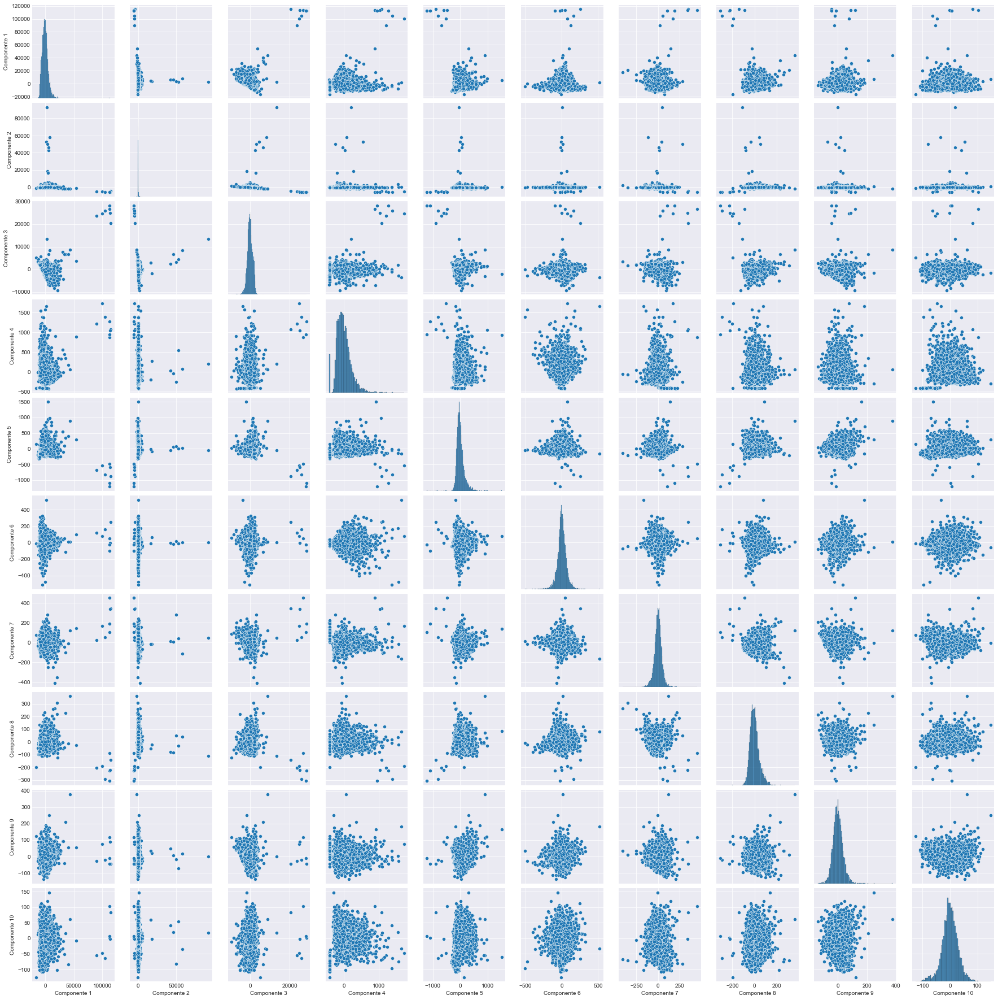

In [14]:
Y2 = pd.DataFrame(Y2)
Y2.columns = [f'Componente {i+1}' for i in range(10)]
sns.pairplot(Y2)

Identificamos las componentes y sus valores máximos y mínimos.

In [15]:
pca2_dataframe = pd.DataFrame(pca2.components_, columns =X.columns)
pd.concat((pca2_dataframe.idxmax(axis=1),pca2_dataframe.max(axis=1), 
           pca2_dataframe.idxmin(axis=1),pca2_dataframe.min(axis=1)),axis=1, keys=['Máximo', 'Valor', 'Mínimo', 'Valor'])

,Máximo,Valor,Mínimo,Valor
0,Area_cel,0.960537,G_S2_CluPromi_cyt,-0.006166
1,Hairiness,0.987930,Area_cel,-0.052996
2,Area_cel,0.272261,Area_nuc,-0.948963
3,G_S2_CluPromi_cyt,0.730287,Perimeter_cel,-0.046218
4,G_S2_CluPromi_cel,0.822203,G_S2_CluShade_cyt,-0.054715
5,G_S2_CluPromi_cyt,0.656220,R_S2_CluPromi_cyt,-0.711392
6,R_S2_CluPromi_nuc,0.416164,Perimeter_cel,-0.640825
7,Perimeter_cel,0.692848,G_S2_CluPromi_cel,-0.143553
8,R_S2_CluPromi_cel,0.672674,G_S2_CluPromi_nuc,-0.520231
9,R_S1_Mean_cyt,0.562354,G_S2_CluPromi_cel,-0.390717


De la anterior tabla podemos concluir que los resultados del modelo son los mismos en el tipo de célula y con respecto a la entidad de la célula. De esta manera, el dataset y las componentes se veb evidenciadas como se dijeron anteriormente.

## ICA

Realizamos ICA y visualizamos los resultados.

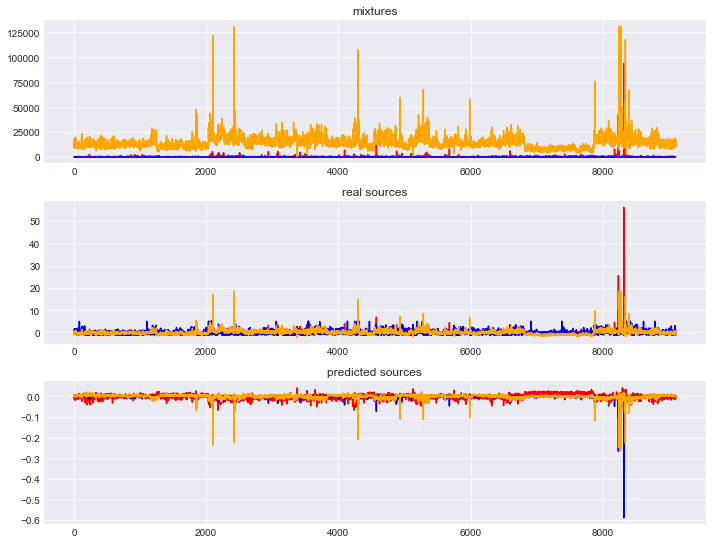

In [16]:
scaler = preprocessing.StandardScaler()
scaler = scaler.fit_transform(X)
ica = FastICA(n_components=3,random_state=42)
X_transformed = ica.fit_transform(X)

fig = plt.figure(figsize=(10,10))
models = [np.array(X), scaler, X_transformed]
names = ['mixtures', 'real sources', 'predicted sources']
colors = ['red', 'blue', 'orange']

for i, (name, model) in enumerate(zip(names, models)):
    plt.subplot(4, 1, i+1)
    plt.title(name)
    for sig, color in zip (model.T, colors):
        plt.plot(sig, color=color)
        
fig.tight_layout()        
plt.show()

## t-SNE

Para el uso de `t-SNE` y con el objetivo de visualizar  los resultados se utilizaron 2 componentes.

In [17]:
tsne = TSNE(n_components=2, perplexity=40, n_iter=300, random_state=42)
tsne_results = tsne.fit_transform(X)

Primero identificaremos dónde se encuentran las componentes con el tipo de célula. Para esto, visualicemos los resultados de la siguiente manera:

[Text(0.5, 1.0, 'T-SNE projection')]

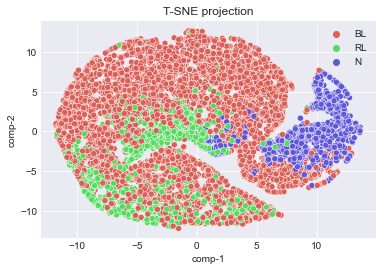

In [18]:
df = pd.DataFrame()
df["y"] = y1
df["comp-1"] = tsne_results[:,0]
df["comp-2"] = tsne_results[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
                palette=sns.color_palette("hls",3),
                data=df).set(title="T-SNE projection") 

Podemos observar que la componente 2 con respecto a la componente 1 se ve identificada en un gran porcentaje por los linfocitos blastos.

Ahora bien, realizando el mismo procedimiento anterior pero con la entidad de la célula, obtuvimos:

[Text(0.5, 1.0, 'T-SNE projection')]

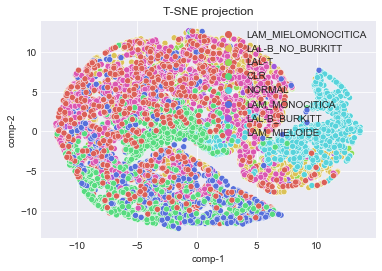

In [19]:
df = pd.DataFrame()
df["y"] = y2
df["comp-1"] = tsne_results[:,0]
df["comp-2"] = tsne_results[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
                palette=sns.color_palette("hls",8),
                data=df).set(title="T-SNE projection") 

Podemos observar que la componente 2 con respecto a la componente 1 se ve identificada en un gran porcentaje por `LAM_MIELMONOCITICA`, `LAL-B_NO_BURKITT` y `LAM_MIELOIDE`.

De esta manera, mirando las dos gráficas podemos evidencias que los linfocitos normales están directamente relacionados con la entidad normal de la célula. Además, los Receptores lectina tipo C (CLR) están relacionados a los linfocitos reactivos. El resto de entidades como la `LAM_MIELOMONOCITICA` y la `LAM_MIELOIDE` se ven identificadas con los linfocitos blastos.

# Modelos

## Tipo de célula como salida

Primero preprocesamos los predictores, realizando una estandarización de los datos.

In [20]:
#Preprocesamos los datos
scaler = preprocessing.StandardScaler().fit(X_train1)

## Regresión logistica

Se realizará una regresión logistica con scikit-learn para predecir el tipo de celula usando los demas descriptores

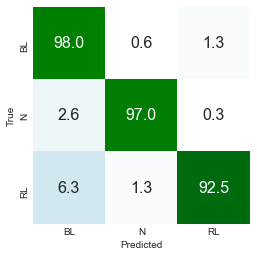

In [21]:
# Se instancia el objeto del modelo RL
lrmodel = LogisticRegression(solver='lbfgs', max_iter=1000)
# Ajuste con estandarizacion de X_train
lrmodel.fit( scaler.transform(X_train1),y_train1)
# Prediccion con la estandarizacion de X_test
y_RL_pred = lrmodel.predict( scaler.transform(X_test1))
# Matriz de confusión
plotCM(y_test1,y_RL_pred, normalize=True)

In [22]:
# Test error
print("El accuracy del test es: {:.2f}".format( accuracy_score(y_test1,y_RL_pred) ))
test_error = 1-accuracy_score(y_test1,y_RL_pred)
print("El error del test es: {:.2f}".format( test_error ) )

El accuracy del test es: 0.97
El error del test es: 0.03


Observamos en nuestra matriz de confusión que para el tipo de celula de leucocitos blastos tenemos la mayor precisión con un 98% y para los linfocitos reactivos tenemos la menor con 92.7%, sin embargo, aunque sea la menor sigue siendo una predicción excelente. Esto, lo terminamos de confirmar al observar el accuracy del test, done obtenemos un 97% de precisión. 

In [23]:
F,p = feature_selection.f_classif(X_train1, y_train1)

# Crea un dataframe con los F-value y p-value para visualizar mejor
pd.DataFrame(np.array([F,p]).T,index=X_train1.columns, columns=['F_value','p_value'])

,F_value,p_value
Hairiness,0.718446,4.875488e-01
RBCproximity,383.710999,4.516609e-158
Area_cel,631.838854,4.751981e-251
EquivDiameter_cel,1233.660049,0.000000e+00
Eccentricity_cel,56.136437,6.801636e-25
...,...,...
Pgra_G_kurto_nuc,1838.786028,0.000000e+00
Pgra_R_kurto_cyt,53.715833,7.345920e-24
Pgra_G_kurto_cyt,18.902534,6.531276e-09
Pgra_R_kurto_cel,2547.494908,0.000000e+00


Al ser nuestros valores p menores a nuestros valores F, podemos concluir que con este dataset nuestro modelo de regresión logistica se ajusta mejor a los datos que un modelo sin variables independientes. Para los valores P observamos que algunas variables como 'EquivDiameter_cel' no tienen relación alguna con nuestra variable independiente (tipo de celula). Así, mismo notamos a priori que nuestra variable con mas correlación hacia el tipo de celula es 'Hairiness'.

## LDA

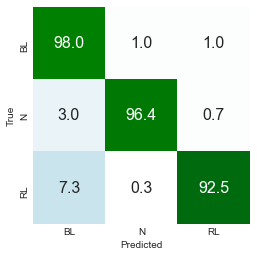

In [24]:
# Se instancia el objeto del modelo LDA
lda_model = LinearDiscriminantAnalysis()
# Ajuste con estandarizacion de X_train
lda_model.fit(scaler.transform(X_train1), y_train1 )
# Prediccion con la estandarizacion de X_test
y_LDA_pred = lda_model.predict(scaler.transform(X_test1) )
# matriz de confusion
plotCM(y_test1,y_LDA_pred,normalize=True)

In [25]:
# Probabilidades anteriores
lda_model.priors_

array([0.71143888, 0.1231759 , 0.16538522])

Las probabilidades a priori son π1 = 0.711, π2 = 0.122 y π3 = 0.165; en otras palabras, el 71.1% de las observaciones de entrenamiento corresponden al tipo de celula BL y el otro 28.8% corresponden a las otras dos tipos de celula. 

In [26]:
# Coeficientes del modelo
lda_model.coef_

array([[-2.89192754e-02, -1.57618943e-01, -8.85110268e-01,
         1.54615661e+00, -1.80827073e-01, -4.68732281e-01,
         2.08360330e-01, -7.77175788e-02,  7.28633837e-01,
         6.31407702e-02, -3.71834511e-01, -4.78758448e-01,
         2.74371340e-01, -2.15059615e-01, -4.20447516e+00,
         6.54494247e+00, -1.09112085e-02, -2.38394278e+00,
         1.32386951e-01, -1.66268806e-03,  2.02371124e+00,
         2.38660351e-01, -1.90492237e+00, -1.81963925e+00,
        -5.10432031e-01, -8.36462808e-02,  4.50883458e-02,
        -5.37103112e-02, -4.65643722e+00,  2.96733884e+00,
         3.36339872e-01, -1.28807068e-01,  1.27181265e+00,
        -1.72159454e+00,  8.14537563e-01, -5.84153712e+00,
        -2.26166533e-01, -2.96383765e+00,  1.30215817e-01,
        -2.94762234e+00,  1.50950806e-01,  3.09569509e+00,
         2.95458740e+00,  1.45091777e+00,  3.98804016e-01,
        -3.28027434e-01, -4.93582437e-01, -1.08578161e-01,
        -2.85258257e-01, -7.88327389e-02, -5.64170617e-0

In [27]:
# Test error
print("El accuracy del test es: {:.2f}".format( accuracy_score(y_test1,y_LDA_pred) ))
test_error = 1-accuracy_score(y_test1,y_LDA_pred)
print("El error del test es: {:.2f}".format( test_error ) )

El accuracy del test es: 0.97
El error del test es: 0.03


Finalmente, notamos que este metodo a partir de la matriz de confusion es practicamente igual a regresión logistica, con excepcion del tipo de celula RL donde se presenta una precisión menor por 0.7%. Sin embargo, al sacar el accuracy es el mismo resultado a regresión logistica.

## QDA

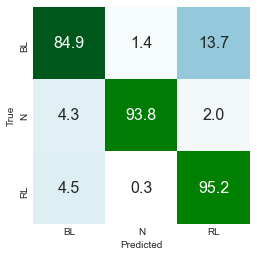

In [28]:
# Se instancia el objeto del modelo QDA
qda_model = QuadraticDiscriminantAnalysis() 
# Ajuste con estandarizacion de X_train
qda_model.fit( scaler.transform(X_train1), y_train1 ) 
# Prediccion con la estandarizacion de X_test
y_QDA_pred = qda_model.predict( scaler.transform(X_test1) )
# matriz de confusion 
plotCM(y_test1, y_QDA_pred,normalize=True) 

In [29]:
# Test error
print("El accuracy del test es: {:.2f}".format( accuracy_score(y_test1,y_QDA_pred) ))
test_error = 1-accuracy_score(y_test1,y_QDA_pred)
print("El error del test es: {:.2f}".format( test_error ) )

El accuracy del test es: 0.87
El error del test es: 0.13


Notamos un decline considerable en cuanto a mejores resultados en comparación con LDA. Por ende, concluimos que la flexibilidad adicional de QDA da como resultao una mayor varianza a la estimación debido a la necesidad de estimar algunas parámetros adicionales. Su acurracy s disminuye en un 10% en contra de la regresión logistica y LDA

## KNN

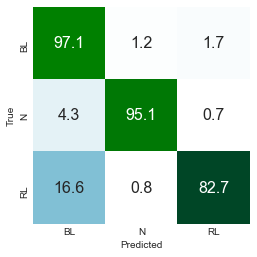

In [30]:
# Se instancia el objeto del modelo KNN
knn_model = KNeighborsClassifier(n_neighbors=10)
# Ajuste con estandarizacion de X_train
knn_model.fit( scaler.transform(X_train1), y_train1 ) 
# Prediccion con la estandarizacion de X_test
y_KNN_pred = knn_model.predict( scaler.transform(X_test1) )
# matriz de confusion 
plotCM(y_test1, y_KNN_pred,normalize=True) 

In [31]:
# Test error
print("El accuracy del test es: {:.2f}".format( accuracy_score(y_test1,y_KNN_pred) ))
test_error = 1-accuracy_score(y_test1,y_KNN_pred)
print("El error del test es: {:.2f}".format( test_error ) )

El accuracy del test es: 0.95
El error del test es: 0.05


Notamos que el modelo que mejor se ajusta a los datos con tipo de célula como salida es LDA partiendo de los accuracy mostrados anteriormente.

## KNN Cross-Validation

A continuación utilizaremos cross-validation para obtener mejores resultados a la hora de utilizar KNN.

In [32]:
scores_mean = []
for n in range(1,21):
    knn_cv = KNeighborsClassifier(n_neighbors=n)
    cv_scores = cross_val_score(knn_cv, X, y1, cv=5)
    scores_mean.append(np.mean(cv_scores))
print(f'El mínimo de los scores es {max(scores_mean)} con n={scores_mean.index(max(scores_mean))+1} vecinos.')

El mínimo de los scores es 0.8812740252608456 con n=18 vecinos.


Verificamos que la cantidad de vecinos sea el óptimo:

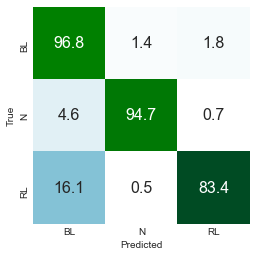

In [33]:
# Se instancia el objeto del modelo KNN
knn_model = KNeighborsClassifier(n_neighbors=18)
# Ajuste con estandarizacion de X_train
knn_model.fit( scaler.transform(X_train1), y_train1 ) 
# Prediccion con la estandarizacion de X_test
y_KNN_pred = knn_model.predict( scaler.transform(X_test1) )
# matriz de confusion 
plotCM(y_test1, y_KNN_pred,normalize=True) 

In [34]:
# Test error
print("El accuracy del test es: {:.2f}".format( accuracy_score(y_test1,y_KNN_pred) ))
test_error = 1-accuracy_score(y_test1,y_KNN_pred)
print("El error del test es: {:.2f}".format( test_error ) )

El accuracy del test es: 0.95
El error del test es: 0.05


Notamos que aunque el accuracy mejora en realidad no es demasiado significativo en el modelo.

## Naive Bayes

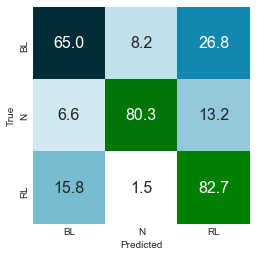

In [35]:
# Se instancia el objeto del modelo Naive Bayes
nb_model = GaussianNB()
# Ajuste con estandarizacion de X_train
nb_model.fit( scaler.transform(X_train1), y_train1 ) 
# Prediccion con la estandarizacion de X_test
y_NB_pred = nb_model.predict( scaler.transform(X_test1) )
# matriz de confusion 
plotCM(y_test1, y_NB_pred,normalize=True) 

In [36]:
# Test error
print("El accuracy del test es: {:.2f}".format( accuracy_score(y_test1,y_NB_pred) ))
test_error = 1-accuracy_score(y_test1,y_NB_pred)
print("El error del test es: {:.2f}".format( test_error ) )

El accuracy del test es: 0.69
El error del test es: 0.31


El peor de los modelos, con una diferencia del 27% a comparación de regresion logistica y LDA Y del 17% con QDA y KNN. Tiene una matriz e confusión pesima en cuanto a predecir los linfocitos blastos. Sin embargo, mejora decentemente con los linfocitos normales y los linfocitos reactivos. Al ser Naive Bayes se toma en cuenta que los predictores son independientes y que la presencia de una caracteristica en particular no afecte a la otra. Es por esto que este modelo es tan malo para nuestro conjunto de datos ya que si tomamos en cuenta cada predictor independientemente para predecir el tipo de celula los resultados serán pesimos. Una evidencia de esto es como pudimos observar en la regresión logistica nuestros valores P nos dicen que la mayoria de las variables no afectan casi al tipo de celula.


 ## Entidad como salida

In [37]:
#Preprocesamos los datos
scaler = StandardScaler().fit(X_train2)

## Regresión logistica

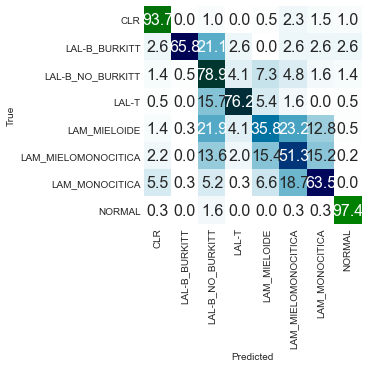

In [38]:
# Se instancia el objeto del modelo RL
lrmodel2 = LogisticRegression(solver='lbfgs', max_iter=1000)
# Ajuste con estandarizacion de X_train
lrmodel2.fit( scaler.transform(X_train2),y_train2)
# Prediccion con la estandarizacion de X_test
y_RL_pred2 = lrmodel2.predict( scaler.transform(X_test2))
# Matriz de confusión
plotCM(y_test2,y_RL_pred2, normalize=True)

Para las entidades CLR y Normal se produce una decente predicción con un 94% y 97% respectivamente. Sin embargo, para los demas se presenta una predicción 'correcta'.

In [39]:
# Test error
print("El accuracy del test es: {:.2f}".format( accuracy_score(y_test2,y_RL_pred2) ))
test_error = 1-accuracy_score(y_test2,y_RL_pred2)
print("El error del test es: {:.2f}".format( test_error ) )

El accuracy del test es: 0.70
El error del test es: 0.30


A comparación de nuestra salida pasada(Tipo de celula) este modelo no se ajusta tan bien. Un acurracy del 70% no es del todo malo, pero nos damos cuenta que para las entidades la probabiliad e que ocurran en funcion a nuestros otros factores no es tan factible. 

In [40]:
F,p = feature_selection.f_classif(X_train2, y_train2)

# Crea un dataframe con los F-value y p-value para visualizar mejor
pd.DataFrame(np.array([F,p]).T,index=X_train2.columns, columns=['F_value','p_value'])

,F_value,p_value
Hairiness,12.034639,2.392678e-15
RBCproximity,131.388429,2.825483e-181
Area_cel,435.192287,0.000000e+00
EquivDiameter_cel,796.202108,0.000000e+00
Eccentricity_cel,47.318778,7.265492e-66
...,...,...
Pgra_G_kurto_nuc,991.047535,0.000000e+00
Pgra_R_kurto_cyt,19.783155,2.107379e-26
Pgra_G_kurto_cyt,8.656735,1.294526e-10
Pgra_R_kurto_cel,985.330488,0.000000e+00


## LDA

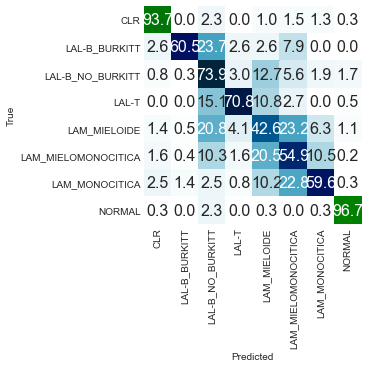

In [41]:
# Se instancia el objeto del modelo LDA
lda_model2 = LinearDiscriminantAnalysis()
# Ajuste con estandarizacion de X_train
lda_model2.fit(scaler.transform(X_train2), y_train2 )
# Prediccion con la estandarizacion de X_test
y2_LDA_pred = lda_model2.predict(scaler.transform(X_test2) )
# matriz de confusion
plotCM(y_test2,y2_LDA_pred,normalize=True)

Para las entidades CLR y Normal se produce una decente predicción con un 93.7% y 96.7% respectivamente.

In [42]:
# Probabilidades anteriores
lda_model2.priors_

array([0.16538522, 0.01584811, 0.21010513, 0.07265024, 0.12929547,
       0.15220461, 0.13133532, 0.1231759 ])

In [43]:
# Coeficientes del modelo
lda_model2.coef_

array([[ 0.0509612 ,  0.43291746, -0.46428943, ..., -0.88094624,
        -0.46966547, -2.50600798],
       [-0.11593669,  0.77572636, 10.35699252, ..., -0.87868111,
        -5.03342791, -5.28243507],
       [-0.07787592, -0.02154815, -1.06696361, ...,  0.12299825,
        -1.65897968,  1.92970138],
       ...,
       [-0.09658207, -0.12445758, -2.39164189, ...,  0.59111998,
        -0.14818415,  2.17323347],
       [ 0.30317628, -0.28957008, -0.78173411, ...,  0.40244673,
         2.13565931,  1.31241676],
       [ 0.08738147,  0.32510433,  5.82412635, ..., -0.23941495,
         2.05580875, -7.32790245]])

In [44]:
# Test error
print("El accuracy del test es: {:.2f}".format( accuracy_score(y_test2,y2_LDA_pred) ))
test_error = 1-accuracy_score(y_test2,y2_LDA_pred)
print("El error del test es: {:.2f}".format( test_error ) )

El accuracy del test es: 0.70
El error del test es: 0.30


Con LDA se presenta una predicción muy parecida a la de regresion logistica, igual que paso con la salida anterior del tipo del celula. Es decir, que para nuestro conjunto de datos estos dos modelos de ajustan de la misma manera para determinar si es demasiado eficiente o si por otro lado no es tan conveniente. En este caso, con las entidades estos dos modelos no son los mejores.

## QDA

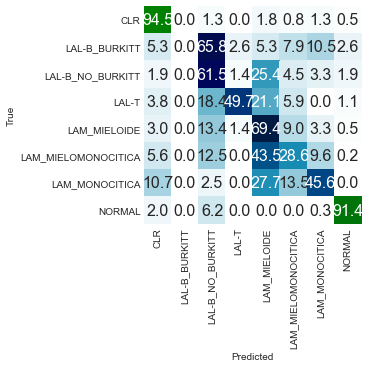

In [45]:
#Instancia al modelo
qda_model2 = QuadraticDiscriminantAnalysis() 
# Ajuste con estandarizacion de X_train
qda_model2.fit( scaler.transform(X_train2), y_train2) 
# Prediccion con la estandarizacion de X_test
y2_QDA_pred = qda_model2.predict( scaler.transform(X_test2) )
# matriz de confusion 
plotCM(y_test2, y2_QDA_pred,normalize=True) 

Podemos observar que hay variables colineales, es decir, una de estas variables es combinación lineal de las otras. Por ende, este modelo no se puede resolver. Esto se puede evidenciar con la variable `LAL-B_BURKITT`.

In [46]:
# Test error
print("El accuracy del test es: {:.2f}".format( accuracy_score(y_test2,y2_QDA_pred) ))
test_error = 1-accuracy_score(y_test2,y2_QDA_pred)
print("El error del test es: {:.2f}".format( test_error ) )

El accuracy del test es: 0.62
El error del test es: 0.38


Incluso un peor que accuracy que LDA y RL, por lo que la flexibilidad adicional de QDA da como resultao otra vez una mayor varianza a la estimación debido a la necesidad de estimar algunas parámetros adicionales. Su acurracy s disminuye en un 10% a comparación de la regresión logistica y LDA

## KNN

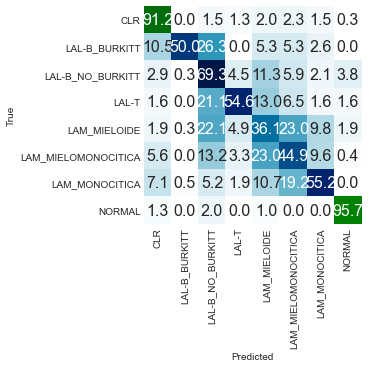

In [47]:
#Instancia al modelo
knn_model2 = KNeighborsClassifier(n_neighbors=10)
# Ajuste con estandarizacion de X_train
knn_model2.fit( scaler.transform(X_train2), y_train2 ) 
# Prediccion con la estandarizacion de X_test
y2_KNN_pred = knn_model2.predict( scaler.transform(X_test2) )
# matriz de confusion 
plotCM(y_test2, y2_KNN_pred,normalize=True) 

In [48]:
# Test error
print("El accuracy del test es: {:.3f}".format( accuracy_score(y_test2,y2_KNN_pred) ))
test_error = 1-accuracy_score(y_test2,y2_KNN_pred)
print("El error del test es: {:.2f}".format( test_error ) )

El accuracy del test es: 0.638
El error del test es: 0.36


## KNN Cross-Validation

A continuación utilizaremos cross-validation para obtener mejores resultados a la hora de utilizar KNN.

In [49]:
scores_mean = []
for n in range(1,21):
    knn_cv = KNeighborsClassifier(n_neighbors=n)
    cv_scores = cross_val_score(knn_cv, X, y2, cv=5)
    scores_mean.append(np.mean(cv_scores))
print(f'El máximo de los scores es {max(scores_mean)} con n={scores_mean.index(max(scores_mean))+1} vecinos.')

El máximo de los scores es 0.47721032399780344 con n=20 vecinos.


Verificamos que la cantidad de vecinos sea el óptimo:

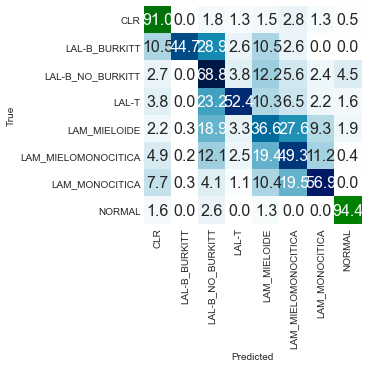

In [50]:
#Instancia al modelo
knn_model2 = KNeighborsClassifier(n_neighbors=20)
# Ajuste con estandarizacion de X_train
knn_model2.fit( scaler.transform(X_train2), y_train2 ) 
# Prediccion con la estandarizacion de X_test
y2_KNN_pred = knn_model2.predict( scaler.transform(X_test2) )
# matriz de confusion 
plotCM(y_test2, y2_KNN_pred,normalize=True) 

In [51]:
# Test error
print("El accuracy del test es: {:.2f}".format( accuracy_score(y_test2,y2_KNN_pred) ))
test_error = 1-accuracy_score(y_test2,y2_KNN_pred)
print("El error del test es: {:.2f}".format( test_error ) )

El accuracy del test es: 0.64
El error del test es: 0.36


Notamos que aunque el accuracy mejora en realidad no es demasiado significativo en el modelo.

El modelo fue igual a QDA y vamos afirmando mas nuestra teoria de que los modelos se ajustan a los datos de manera que van en pareja entre si son extramadamente buenos y decentes por otro lado. 

## NAIVE BAYES

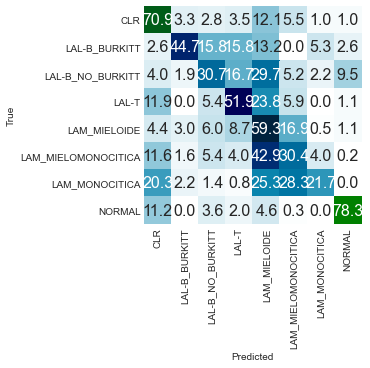

In [52]:
#Instancia al modelo
nb_model2 = GaussianNB()
# Ajuste con estandarizacion de X_train
nb_model2.fit( scaler.transform(X_train2), y_train2 ) 
# Prediccion con la estandarizacion de X_test
y2_NB_pred = nb_model2.predict( scaler.transform(X_test2) )
# matriz de confusion 
plotCM(y_test2, y2_NB_pred,normalize=True) 

In [53]:
# Test error
print("El accuracy del test es: {:.2f}".format( accuracy_score(y_test2,y2_NB_pred) ))
test_error = 1-accuracy_score(y_test2,y2_NB_pred)
print("El error del test es: {:.2f}".format( test_error ) )

El accuracy del test es: 0.46
El error del test es: 0.54


El peor de todos los modelos en general, tanto para la salida del tipo de celula como la entidad. Podmeos concluir finalmente que los modelos se ajustan de mucha mejor manera hacia los datos con una salida Y del tipo de celula. Todos los modelos en sí son 'buenos', a excepcion de LDA y regresion logistica que son practicamente perfectos para nuestra primera salida. Sin embargo, para la salida de entidades no se genera este fenomeno sino que todos los modelos son practicamente igual de decentes para predecirlo. 

## GLM

Para GLM usaremos de Y, el area de las celulas y los descriptores serán todos menos ese que usamos para Y. Ademas usaremos GLM con la función link ya que esta sigue una distribución normal.

In [54]:
# Elegimos nuestro Y
y = data['Area_cel']
data1 = data.drop('Area_cel', axis=1)
# Descriptores
x = data1.iloc[:,5:]

In [55]:
fit_lm = smf.glm('y ~ x', data).fit()
print(fit_lm.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                 9105
Model:                            GLM   Df Residuals:                     8891
Model Family:                Gaussian   Df Model:                          213
Link Function:               identity   Scale:                          55295.
Method:                          IRLS   Log-Likelihood:                -62526.
Date:                Sat, 16 Oct 2021   Deviance:                   4.9163e+08
Time:                        22:51:28   Pearson chi2:                 4.92e+08
No. Iterations:                     3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -2.035e+04   4607.480     -4.417      0.0

El GLM generaliza la regresión lineal al permitir que el modelo lineal esté relacionado con la variable de respuesta a través de una función de enlace y al permitir que la magnitud de la varianza de cada medición sea una función de su valor predicho. El intercept es el valor del predictor lineal cuando nuestros x son 0. Estos valores se dan mucho por lo que este es importante.

## Clustering con GMM

### Clustering para tipo de célula como salida

Ahora, haremos clustering usando modelos mixtos Gaussianos. En primera instancia, haremos uso de 3 clusters, ya que clasificaremos las células según su tipo.

A continuación hacemos el entrenamiento del modelo con los datos de entrenamiento. Primero, estandarizamos los datos.

In [56]:
scaler = StandardScaler().fit(X_train1)

#### Covarianza tipo 'tied'

Creamos la instancia del modelo de clustering con una covarianza de tipo 'tied'.

In [57]:
gmm_model = GaussianMixture(n_components=3, covariance_type="tied", random_state=42)
gmm_model.fit(scaler.transform(X_train1))

GaussianMixture(covariance_type='tied', n_components=3, random_state=42)

Calculamos las probabilidades que tiene cada obervación de estar en cada uno de los tres clusters.

In [58]:
prob = gmm_model.predict_proba(scaler.transform(X_train1))
pd.DataFrame(prob)

,0,1,2
0,1.512149e-15,0.0,1.000000e+00
1,3.773659e-20,0.0,1.000000e+00
2,2.001962e-17,0.0,1.000000e+00
3,4.531500e-17,0.0,1.000000e+00
4,1.000000e+00,0.0,5.064213e-21
...,...,...,...
6368,6.069890e-15,0.0,1.000000e+00
6369,6.185974e-18,0.0,1.000000e+00
6370,3.791392e-17,0.0,1.000000e+00
6371,3.457695e-17,0.0,1.000000e+00


Ahora, comparamos la predicción con el tipo real de células.

In [59]:
y_pred = gmm_model.predict(scaler.transform(X_test1))
pd.set_option("display.max_rows", None, "display.max_columns", None)
pd.DataFrame(np.c_[y_test1,y_pred], columns=['Tipo de célula', 'Predicción'])

,Tipo de célula,Predicción
0,BL,2
1,BL,2
2,BL,2
3,BL,2
4,BL,0
5,BL,2
6,BL,2
7,BL,2
8,BL,2
9,BL,2


Observe que la predicción obtenida está dada por los dígitos 0, 1 y 2, correspondientes a cada uno de los clusters. Por ello, es necesario codificar el vector de tipos de células en dígitos también, de forma que podamos comparar el tipo de célula real con la predicción obtenida.

In [60]:
le = LabelEncoder()
y_test1_ = le.fit_transform(y_test1)
le.classes_

array(['BL', 'N', 'RL'], dtype=object)

Observemos ahora la matriz de confusión entre los datos originales y los obtenidos en el clustering.

In [61]:
matriz = confusion_matrix(y_test1_, y_pred)
matriz

array([[  61,   54, 1915],
       [   2,   28,  274],
       [ 162,    0,  236]], dtype=int64)

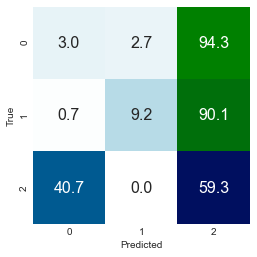

In [62]:
plotCM(y_test1_,y_pred,normalize=True)

Además, observamos el accuracy de este modelo.

In [63]:
metrics.accuracy_score(y_test1_,y_pred)

0.11896046852122986

#### Covarianza tipo 'full'

Ahora, hacemos el modelo con covarianza tipo 'full'.

In [64]:
gmm_model2 = GaussianMixture(n_components=3, covariance_type="full", random_state=42)
gmm_model2.fit(scaler.transform(X_train1))
prob = gmm_model2.predict_proba(scaler.transform(X_train1))
pd.DataFrame(prob)

,0,1,2
0,1.000000e+00,0.0,1.988926e-15
1,1.000000e+00,0.0,0.000000e+00
2,1.152292e-190,0.0,1.000000e+00
3,0.000000e+00,0.0,1.000000e+00
4,1.000000e+00,0.0,0.000000e+00
5,1.000000e+00,0.0,1.328046e-13
6,4.796925e-24,0.0,1.000000e+00
7,1.000000e+00,0.0,0.000000e+00
8,1.000000e+00,0.0,2.155092e-27
9,1.000000e+00,0.0,1.341273e-268


In [65]:
y_pred2 = gmm_model2.predict(scaler.transform(X_test1))

In [66]:
matriz = confusion_matrix(y_test1_, y_pred2)
matriz

array([[1234,   54,  742],
       [  59,   28,  217],
       [ 382,    0,   16]], dtype=int64)

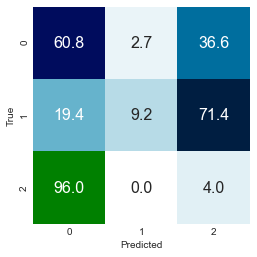

In [67]:
plotCM(y_test1_,y_pred2,normalize=True)

In [68]:
metrics.accuracy_score(y_test1_,y_pred2)

0.4677891654465593

#### Covarianza tipo 'diag'

Ahora, hacemos el modelo con covarianza tipo 'diag'.

In [69]:
gmm_model3 = GaussianMixture(n_components=3, covariance_type="diag", random_state=42)
gmm_model3.fit(scaler.transform(X_train1))
prob = gmm_model3.predict_proba(scaler.transform(X_train1))
pd.DataFrame(prob)

,0,1,2
0,6.218818e-30,0.0,1.000000e+00
1,1.000000e+00,0.0,5.894583e-17
2,2.922101e-159,0.0,1.000000e+00
3,1.238467e-187,0.0,1.000000e+00
4,1.000000e+00,0.0,1.370033e-250
5,3.189051e-15,0.0,1.000000e+00
6,1.000000e+00,0.0,6.172600e-67
7,1.000000e+00,0.0,0.000000e+00
8,5.121429e-27,0.0,1.000000e+00
9,1.000000e+00,0.0,3.959744e-42


In [70]:
y_pred3 = gmm_model3.predict(scaler.transform(X_test1))

In [71]:
matriz = confusion_matrix(y_test1_, y_pred3)
matriz

array([[ 884,   54, 1092],
       [  52,   28,  224],
       [ 326,    0,   72]], dtype=int64)

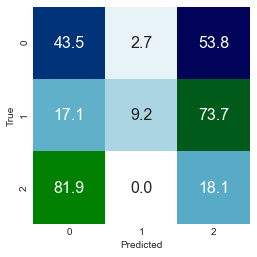

In [72]:
plotCM(y_test1_,y_pred3,normalize=True)

In [73]:
metrics.accuracy_score(y_test1_,y_pred3)

0.3601756954612006

#### Resultados y observaciones

De acuerdo a los resultados obtenidos, podemos observar que en cuanto a la métrica de accuracy, la covarianza que brinda resultados más precisos es la tipo 'full'. Mientras que la que brinda menor precisión es 'tied'. Sin embargo, en todos los casos vemos que es un porcentaje de accuracy muy bajo. 

Además, si observamos la matriz de confusión en cada caso, vemos que, cuando usamos covarianza 'tied', la mayoría de observaciones es clasificada en el cluster 2. Por otro lado, con covarianza 'full', las observaciones se clasifican de forma casi que equivalente en los tres clusters, sin lograr una clasificación correcta en su mayoría. Por último, con convarianza 'diag' las observaciones se clasifican de forma errónea para el tipo de célula 1 y 3, y correctamente para el tipo de célula 2.

### Clustering para entidad como salida

Ahora decidimos usar 8 clusters, ya que haremos la clasificación según la entidad de las células. Nuevamente, seguimos el mismo procedimiento anterior, estandarizando los datos primero.

In [74]:
scaler = StandardScaler().fit(X_train2)

#### Covarianza tipo 'tied'

In [75]:
gmm_model = GaussianMixture(n_components=8, covariance_type="tied", random_state=42)
gmm_model.fit(scaler.transform(X_train2))

GaussianMixture(covariance_type='tied', n_components=8, random_state=42)

In [76]:
prob = gmm_model.predict_proba(scaler.transform(X_train2))
pd.DataFrame(prob)

,0,1,2,3,4,5,6,7
0,9.976318e-01,1.615687e-30,0.0,3.118239e-11,1.197381e-21,4.169838e-08,1.246179e-14,2.368191e-03
1,7.200191e-05,3.074860e-34,0.0,1.072763e-16,1.304254e-20,6.599679e-08,1.161340e-12,9.999279e-01
2,9.995334e-01,8.944365e-32,0.0,3.835704e-04,5.990352e-12,8.820566e-08,6.750945e-13,8.297080e-05
3,9.902078e-01,5.341899e-33,0.0,9.782859e-03,3.367016e-16,8.521417e-08,2.140503e-11,9.305306e-06
4,7.475740e-37,1.000000e+00,0.0,3.105876e-48,3.890062e-51,9.214977e-19,7.356235e-43,5.975700e-36
5,9.999985e-01,3.493286e-33,0.0,1.891668e-10,4.374437e-17,4.990278e-09,1.009131e-12,1.449350e-06
6,9.999904e-01,4.946427e-31,0.0,4.152058e-07,3.132374e-16,5.260240e-08,2.441280e-11,9.133279e-06
7,4.193610e-41,1.000000e+00,0.0,2.724868e-50,2.633422e-55,2.006794e-28,4.231031e-49,1.415931e-40
8,1.180984e-03,6.297600e-31,0.0,2.016408e-14,5.450456e-21,1.696230e-08,7.632276e-15,9.988190e-01
9,4.954568e-03,2.491918e-19,0.0,3.592768e-11,4.929682e-18,1.988493e-01,8.725192e-10,7.961961e-01


In [77]:
y_pred = gmm_model.predict(scaler.transform(X_test2))
pd.set_option("display.max_rows", None, "display.max_columns", None)
pd.DataFrame(np.c_[y_test2,y_pred], columns=['Entidad', 'Predicción'])

,Entidad,Predicción
0,LAM_MIELOMONOCITICA,5
1,LAL-T,7
2,LAM_MIELOIDE,7
3,LAM_MIELOIDE,0
4,LAM_MONOCITICA,1
5,LAL-T,0
6,LAM_MIELOIDE,0
7,LAL-B_NO_BURKITT,3
8,LAM_MIELOIDE,0
9,LAM_MIELOIDE,3


In [78]:
le = LabelEncoder()
y_test2_ = le.fit_transform(y_test2)
le.classes_

array(['CLR', 'LAL-B_BURKITT', 'LAL-B_NO_BURKITT', 'LAL-T',
       'LAM_MIELOIDE', 'LAM_MIELOMONOCITICA', 'LAM_MONOCITICA', 'NORMAL'],
      dtype=object)

In [79]:
matriz = confusion_matrix(y_test2_, y_pred)
matriz

array([[ 13, 140,   0,   2,   0, 120,   1, 122],
       [ 22,   0,   1,   8,   0,   2,   0,   5],
       [401,   3,  40, 117,  16,  16,   2,  34],
       [110,   0,   2,   9,   2,   6,   0,  56],
       [248,   1,   4,  10,   1,  16,   3,  83],
       [223,   7,   5,  15,   0,  62,   1, 135],
       [ 97,  36,   2,   2,   0, 103,   0, 124],
       [ 13,   0,  28,   5,  84,   1, 171,   2]], dtype=int64)

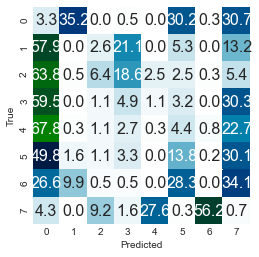

In [80]:
plotCM(y_test2_,y_pred,normalize=True)

In [81]:
metrics.accuracy_score(y_test2_,y_pred)

0.04648609077598829

#### Covarianza tipo 'full'

In [82]:
gmm_model2 = GaussianMixture(n_components=8, covariance_type="full", random_state=42)
gmm_model2.fit(scaler.transform(X_train2))
prob = gmm_model2.predict_proba(scaler.transform(X_train2))
pd.DataFrame(prob)

,0,1,2,3,4,5,6,7
0,9.373276e-18,0.000000e+00,0.0,1.639244e-39,0.000000e+00,2.548388e-87,5.058665e-108,1.000000e+00
1,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,3.742262e-83,1.000000e+00,5.543956e-155
2,0.000000e+00,0.000000e+00,0.0,1.000000e+00,3.511554e-112,0.000000e+00,3.151880e-169,4.152303e-171
3,1.000000e+00,0.000000e+00,0.0,9.565762e-138,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
4,0.000000e+00,1.000000e+00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
5,1.000000e+00,0.000000e+00,0.0,6.938969e-78,0.000000e+00,5.988169e-77,4.137868e-92,1.791018e-73
6,1.000000e+00,0.000000e+00,0.0,6.148077e-254,0.000000e+00,7.157883e-92,2.587046e-67,8.428032e-254
7,0.000000e+00,1.000000e+00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
8,1.659292e-184,0.000000e+00,0.0,2.182565e-102,0.000000e+00,1.961644e-194,8.835496e-136,1.000000e+00
9,0.000000e+00,1.182477e-148,0.0,0.000000e+00,0.000000e+00,1.908861e-68,1.000000e+00,4.339693e-227


In [83]:
y_pred2 = gmm_model2.predict(scaler.transform(X_test2))

In [84]:
matriz = confusion_matrix(y_test1_, y_pred2)
matriz

array([[371,  79,  54, 368,  48, 455,  62, 593],
       [  1,   3,  28,  13, 110,   0, 148,   1],
       [  1, 165,   0,   5,   3, 136,  20,  68],
       [  0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0]], dtype=int64)

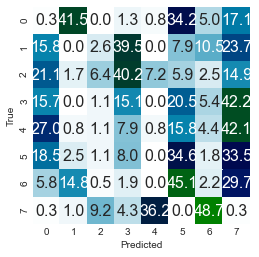

In [85]:
plotCM(y_test2_,y_pred2,normalize=True)

In [86]:
metrics.accuracy_score(y_test2_,y_pred2)

0.08638360175695461

#### Covarianza tipo 'diag'

In [87]:
gmm_model3 = GaussianMixture(n_components=8, covariance_type="diag", random_state=42)
gmm_model3.fit(scaler.transform(X_train2))
prob = gmm_model3.predict_proba(scaler.transform(X_train2))
pd.DataFrame(prob)

,0,1,2,3,4,5,6,7
0,9.999072e-01,0.000000e+00,0.0,3.657203e-17,1.258981e-102,1.099945e-115,2.107049e-37,9.280181e-05
1,5.566959e-182,1.169428e-180,0.0,2.855076e-105,1.571418e-104,5.839477e-84,1.000000e+00,1.280329e-198
2,7.327524e-168,0.000000e+00,0.0,1.000000e+00,4.777555e-44,0.000000e+00,9.342093e-89,1.486772e-159
3,1.791240e-135,0.000000e+00,0.0,5.054714e-01,4.945286e-01,0.000000e+00,1.340737e-62,0.000000e+00
4,0.000000e+00,1.000000e+00,0.0,0.000000e+00,0.000000e+00,1.047455e-282,5.467279e-205,0.000000e+00
5,1.920235e-18,6.539992e-255,0.0,2.670953e-31,1.340105e-76,2.822969e-84,1.000000e+00,2.326614e-87
6,2.441069e-39,1.375283e-65,0.0,1.269748e-107,8.119021e-107,1.863942e-02,9.813606e-01,3.821246e-248
7,0.000000e+00,1.000000e+00,0.0,0.000000e+00,0.000000e+00,1.884132e-302,7.005742e-228,0.000000e+00
8,8.872891e-64,0.000000e+00,0.0,1.897419e-47,2.803305e-155,1.975507e-114,1.517257e-65,1.000000e+00
9,5.741961e-127,1.536691e-65,0.0,3.202645e-147,4.468168e-121,1.946053e-35,1.000000e+00,1.403360e-205


In [88]:
y_pred3 = gmm_model3.predict(scaler.transform(X_test2))

In [89]:
matriz = confusion_matrix(y_test2_, y_pred3)
matriz

array([[  7, 186,   0,  16,   6, 103,  34,  46],
       [  2,   0,   1,  14,   1,   2,  15,   3],
       [ 82,  15,  40, 257,  92,  28,  53,  62],
       [ 22,   1,   2,  41,   2,  29,  34,  54],
       [ 96,   3,   4,  66,   9,  52,  42,  94],
       [104,  17,   5,  49,  10, 134,  35,  94],
       [ 40,  64,   2,  12,   1, 135,  31,  79],
       [  1,   3,  28,  19, 146,   1, 105,   1]], dtype=int64)

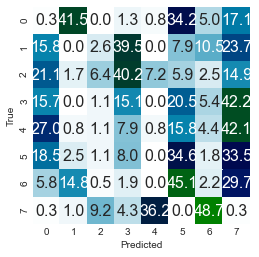

In [90]:
plotCM(y_test2_,y_pred2,normalize=True)

In [91]:
metrics.accuracy_score(y_test2_,y_pred3)

0.09626647144948755

#### Resultados y observaciones

En esta caso, vemos que la precisión a la hora de realizar el clustering es mucho menor que cuando lo intentamos con 3 clusters.

Además, de acuerdo a los resultados obtenidos, podemos observar que en cuanto a la métrica de accuracy, la covarianza que brinda resultados más precisos es la tipo `tied`. Mientras que la que brinda menor precisión es `diag`. Sin embargo, en los tres casos, los resultados obtenidos son muy poco precisos.  

Además, si observamos la matriz de confusión en cada caso, vemos que con la covarianza tipo `tied`, la mayoría de observaciones se clasifican en el cluster 6. Por otro lado, con la covarianza `full`, las observaciones se ubican en la parte superior de la matriz. Por último, con la covarianza `diag`, las observaciones se ubican en todos los clusters, pero no de manera correcta. En todos los casos, las observaciones están clasificadas de forma errónea en los clusters.

# Conclusiones 
- Observando los modelos de Clustering con GMM, vemos que los resultados obtenidos no son satisfactorios en lo absoluto. Una posible razón de esto es el número de clusters en ambos casos. Escogimos tanto 3 como 8 clusters, teniendo en cuenta que las observaciones son clasificadas en tipo de célula (3 tipos de célula) y en entidad (8 entidades). Sin embargo, contamos con muchos predictores, los cuales brindan demasiada información, haciendo que sea muy difícil usar este método para clasificar los datos en tan pocos clusters.

- Analizando las 10 componentes principales de los datos, notamos que los descriptores que más aportan al dataset de las células son el área de la célula, las vellosidades de la célula y el área del núcleo. Las demás componentes aportan a este pero no de la misma manera. Los otros descriptores que se acercan a estos son los descriptores de segundo orden de cluster prominense tanto de citoplasma como de núcleo.

- Observando los resultados obtenidos en todo el proyecto, podemos ver que cuando consideramos el tipo de célula como salida, el performance de los modelos implementados, teniendo el accuracy en cuenta, es considerablemente mejor que si consideramos la entidad como salida.

- KNN, regresion logistica y LDA son nuestros mejores modelos para el Y con tipo de celula. Sus acurracy's de 95% y 97% respectivamente nos permiten concluir que los datos se ajustan de manera casi perfecta.

- Naive Bayes es el peor modelo para cualquier tipo salida. Es decir al querer comparar como cada varibale predictora independientemente afecta nuestra Y nos genera un modelo no eficiente. Es decir, es mejor mirarlas todas en complemento.

<div style="text-align: right"><b> Jessenia Piza Londoño, Manuela Acosta Fajardo & Sebastián Martínez Vidal. </b></div>